# necessary libarary to import 

In [2]:
# necesssary libraries are to be imported to execute the following project 

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import warnings

# importing data to the jupyter files 

In [4]:
data = pd.read_excel("Storedata.xlsx")

In [5]:
# READING THE SAMPLE OF THE DATA CHECKING WEATHER DATA IS LOADED OR NOT 

In [6]:
data.sample()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
6925,6926,CA-2015-137925,11/30/2015,12/4/2015,Standard Class,JL-15235,Janet Lee,Consumer,United States,New York City,...,10035,East,FUR-BO-10001608,Furniture,Bookcases,"Hon Metal Bookcases, Black",681.408,12,0.2,42.588


# descriptive statstics for numerical features

In [7]:
data.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,55190.379428,229.858001,3.789574,0.156203,28.656896
std,2885.163629,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1.000000,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [8]:
data.describe(include='O')

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Region,Product ID,Category,Sub-Category,Product Name
count,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994
unique,5009,1237,1334,4,793,788,3,1,531,49,4,1862,3,17,1792
top,CA-2017-100111,9/5/2016,12/16/2015,Standard Class,WB-21850,False,Consumer,United States,New York City,California,West,OFF-PA-10001970,Office Supplies,Binders,False
freq,14,38,35,5968,37,89,5191,9994,915,2001,3203,19,6026,1523,278


In [9]:
# describing  the columns present in the data set

In [10]:
data.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [11]:
# Check for null values

In [12]:
print(data.isnull().sum())
print(f'There is a total of {data.isnull().sum().sum()/data.shape[0] * 100} NaN values')

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64
There is a total of 0.0 NaN values


In [13]:
# Check for duplicated values 

In [14]:
data.duplicated().sum()

0

In [15]:
#display duplicated values

In [16]:
data[data.duplicated(keep='last')]

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit


In [17]:
#remove duplicated values

In [18]:
data.drop_duplicates()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,9990,CA-2014-110422,1/21/2014,1/23/2014,Second Class,TB-21400,Tom Boeckenhauer,Consumer,United States,Miami,...,33180,South,FUR-FU-10001889,Furniture,Furnishings,Ultra Door Pull Handle,25.2480,3,0.20,4.1028
9990,9991,CA-2017-121258,2/26/2017,3/3/2017,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,FUR-FU-10000747,Furniture,Furnishings,Tenex B1-RE Series Chair Mats for Low Pile Car...,91.9600,2,0.00,15.6332
9991,9992,CA-2017-121258,2/26/2017,3/3/2017,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,TEC-PH-10003645,Technology,Phones,Aastra 57i VoIP phone,258.5760,2,0.20,19.3932
9992,9993,CA-2017-121258,2/26/2017,3/3/2017,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,OFF-PA-10004041,Office Supplies,Paper,"It's Hot Message Books with Stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200


#country has unique value so we can drop this columns because they are superfluous

In [19]:
data.drop(columns=['Row ID','Postal Code','Country'], inplace=True)
data.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'City', 'State', 'Region', 'Product ID',
       'Category', 'Sub-Category', 'Product Name', 'Sales', 'Quantity',
       'Discount', 'Profit'],
      dtype='object')

# Data extraction - creation of new columns:

In [20]:
data['Order Date'] = pd.to_datetime(data['Order Date'], format='%m/%d/%Y')
data['Ship Date'] = pd.to_datetime(data['Ship Date'], format='%m/%d/%Y')

data['Year'] = data['Order Date'].dt.year
data['Month'] = data['Order Date'].dt.month_name()
data['Day'] = data['Order Date'].dt.day
data['Year-Month'] = data['Year'].astype(str) + '-' + data['Month'].astype(str)
data['Year-Month'] = pd.to_datetime(data['Year-Month'], format='%Y-%B')


In [21]:
#creation of new columns named as "delivered days "

In [22]:
data['Delivery Days'] = data['Ship Date'] - data['Order Date']
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   Order ID       9994 non-null   object         
 1   Order Date     9994 non-null   datetime64[ns] 
 2   Ship Date      9994 non-null   datetime64[ns] 
 3   Ship Mode      9994 non-null   object         
 4   Customer ID    9994 non-null   object         
 5   Customer Name  9994 non-null   object         
 6   Segment        9994 non-null   object         
 7   City           9994 non-null   object         
 8   State          9994 non-null   object         
 9   Region         9994 non-null   object         
 10  Product ID     9994 non-null   object         
 11  Category       9994 non-null   object         
 12  Sub-Category   9994 non-null   object         
 13  Product Name   9994 non-null   object         
 14  Sales          9994 non-null   float64        
 15  Quan

In [23]:
# describe about the delivery days columns 

In [24]:
data['Delivery Days'].describe()

count                         9994
mean     3 days 22:59:46.311787072
std      1 days 17:56:29.766161104
min                0 days 00:00:00
25%                3 days 00:00:00
50%                4 days 00:00:00
75%                5 days 00:00:00
max                7 days 00:00:00
Name: Delivery Days, dtype: object

# Data visulazation 

In [25]:
# Plot distribution of the Categorial columns

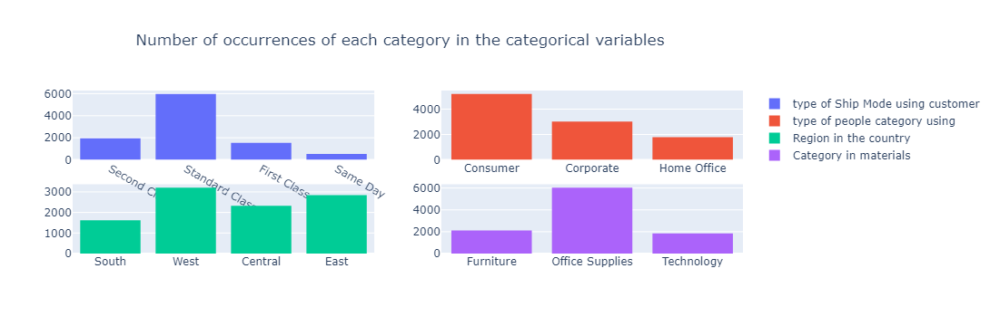

In [26]:
ship_mode = go.Histogram(x=data["Ship Mode"],name="type of Ship Mode using customer ")
segment = go.Histogram(x=data["Segment"],name="type of people category using ")
Region = go.Histogram(x=data["Region"],name="Region in the country ")
category = go.Histogram(x=data["Category"],name="Category in materials ")

fig = make_subplots(rows=2, cols=2)
fig.append_trace(ship_mode, row = 1, col = 1)
fig.append_trace(segment, row = 1, col = 2)
fig.append_trace(Region, row = 2, col = 1)
fig.append_trace(category, row = 2, col = 2)
fig.update_layout(
    title_text = 'Number of occurrences of each category in the categorical variables',
    title_x=0.40
)

fig.show()


In [27]:
# represenation of type of classes transporation in the the each state of america in the form of Tree map 

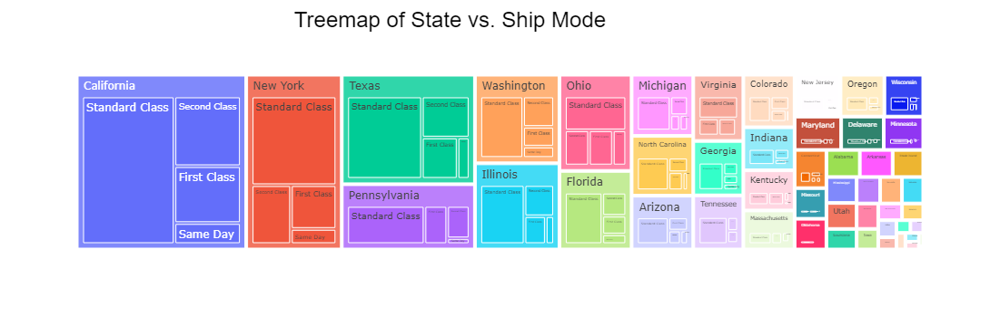

In [28]:
state_ship_mode_counts = data.groupby(['State', 'Ship Mode']).size().reset_index(name='Count')
fig = px.treemap(state_ship_mode_counts, path=['State', 'Ship Mode'], values='Count')
fig.update_layout( title='Treemap of State vs. Ship Mode',title_x=0.45,width=1600,title_font=dict(size=24, family="Arial", color="black"))
fig.show()


In [29]:
# the average order value for each shipping mode

In [30]:
for i in data['Ship Mode'].unique():
    avarage = data[data['Ship Mode']==i]['Sales'].mean()
    print(60*'-')
    print(f'Avarage order value for "{i}" shipping mode is {avarage:.2f}')

------------------------------------------------------------
Avarage order value for "Second Class" shipping mode is 236.09
------------------------------------------------------------
Avarage order value for "Standard Class" shipping mode is 227.58
------------------------------------------------------------
Avarage order value for "First Class" shipping mode is 228.50
------------------------------------------------------------
Avarage order value for "Same Day" shipping mode is 236.40


In [31]:
# the average sales value for each sub-category product

In [32]:
for i in data['Sub-Category'].unique():
    avarage = data[data['Sub-Category']==i]['Sales'].mean()
    print(60*'-')
    print(f'Avarage order value for "{i}" shipping mode is {avarage:.2f}')

------------------------------------------------------------
Avarage order value for "Bookcases" shipping mode is 503.86
------------------------------------------------------------
Avarage order value for "Chairs" shipping mode is 532.33
------------------------------------------------------------
Avarage order value for "Labels" shipping mode is 34.30
------------------------------------------------------------
Avarage order value for "Tables" shipping mode is 648.79
------------------------------------------------------------
Avarage order value for "Storage" shipping mode is 264.59
------------------------------------------------------------
Avarage order value for "Furnishings" shipping mode is 95.83
------------------------------------------------------------
Avarage order value for "Art" shipping mode is 34.07
------------------------------------------------------------
Avarage order value for "Phones" shipping mode is 371.21
-----------------------------------------------------

In [33]:
# How does the average order value for each customer segment?

In [34]:
for i in data['Segment'].unique():
    avarage = data[data['Segment']==i]['Sales'].mean()
    print(60*'-')
    print(f'Avarage sale for {i} is {avarage:.2f}')

------------------------------------------------------------
Avarage sale for Consumer is 223.73
------------------------------------------------------------
Avarage sale for Corporate is 233.82
------------------------------------------------------------
Avarage sale for Home Office is 240.97


# analysis between the region and type of shipment mode used by the region people 

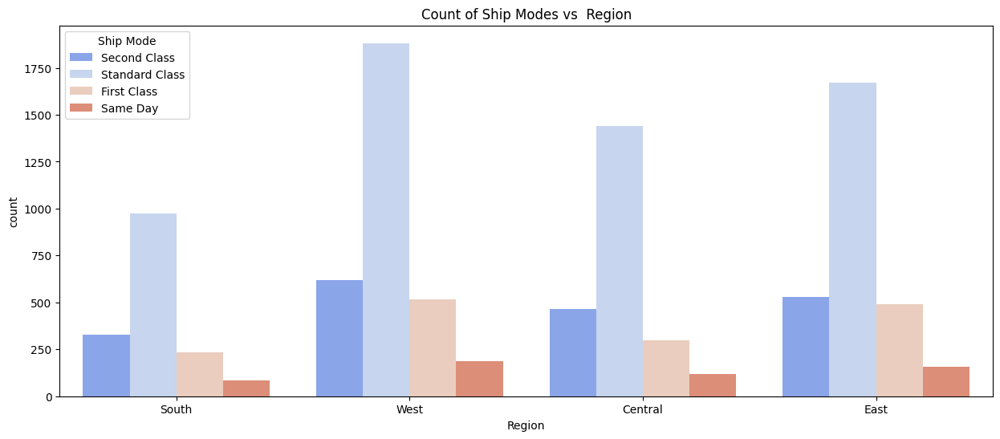

In [35]:
plt.figure(figsize=(15,6))
sns.countplot(data, x='Region', hue='Ship Mode', palette='coolwarm') 
plt.title('Count of Ship Modes vs  Region')
plt.show()

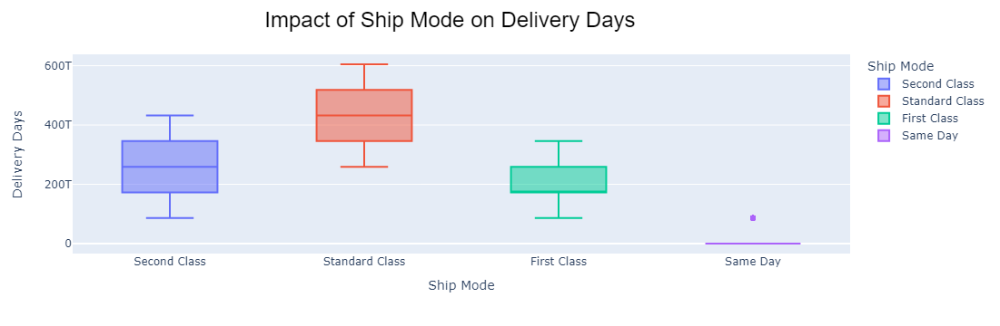

In [36]:
box_fig = px.box(data, x='Ship Mode', y='Delivery Days', color='Ship Mode')
box_fig.update_layout(title="Impact of Ship Mode on Delivery Days",title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
box_fig.show()

In [37]:
# The no of products in each sub category 

In [38]:
data.groupby("Sub-Category")["Product ID"].count().drop_duplicates(keep='last')

Sub-Category
Accessories     775
Appliances      466
Art             796
Binders        1523
Bookcases       228
Chairs          617
Copiers          68
Envelopes       254
Fasteners       217
Furnishings     957
Labels          364
Machines        115
Paper          1370
Phones          889
Storage         846
Supplies        190
Tables          319
Name: Product ID, dtype: int64

# sales wise analysis 

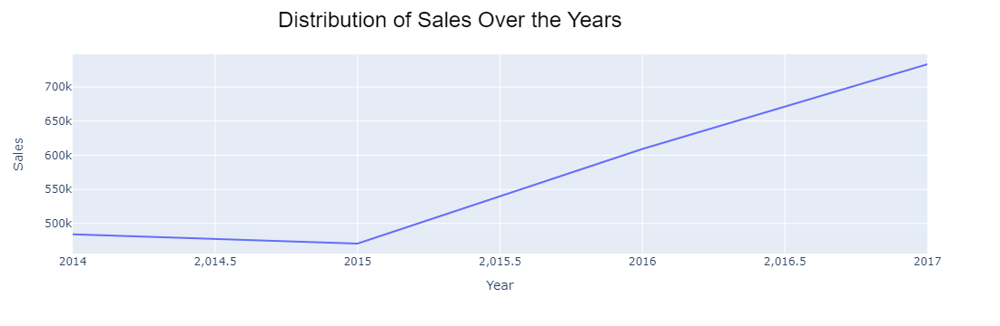

In [39]:
#What is distribution of sales over the past years
yearly_sales = data.groupby('Year')['Sales'].sum().reset_index()
yearly_sales
fig = px.line(yearly_sales, x='Year', y='Sales' )
fig .update_layout(title='Distribution of Sales Over the Years',title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
fig.show()

In [40]:
category_sales = pd.DataFrame(data.groupby(['Year-Month', 'Category'])['Sales'].sum())
category_sales.sort_values(by='Year-Month')
category_sales

Sales
Year-Month Category                   
2014-01-01 Furniture         6242.5250
           Office Supplies   4851.0800
           Technology        3143.2900
2014-02-01 Furniture         1839.6580
           Office Supplies   1071.7240
...                                ...
2017-11-01 Office Supplies  31472.3370
           Technology       49918.7730
2017-12-01 Furniture        31407.4668
           Office Supplies  30436.9420
           Technology       21984.9100

[144 rows x 1 columns]

In [41]:
# sales distrubation over in each category using the linear graphs with the  different colour represenation of each category 

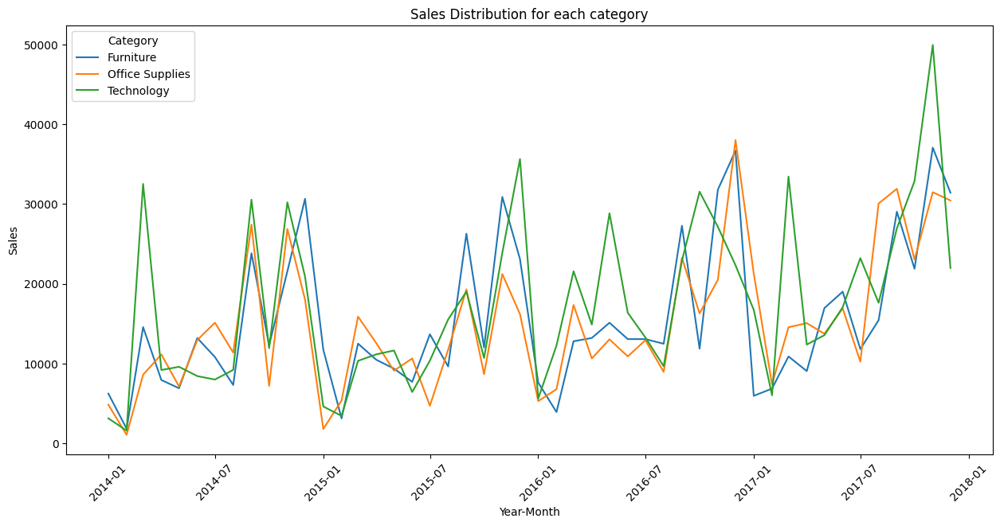

In [42]:
plt.figure(figsize=(15, 7))
plt.title('Sales Distribution for each category')
sns.lineplot(category_sales, x='Year-Month', y='Sales', hue='Category')
plt.xticks(rotation=45)
plt.show()

In [43]:
# which  months owns the largest profits 

In [44]:
monthly_sales = data.groupby(['Year', 'Month'])[['Sales', 'Profit']].sum().reset_index()
monthly_sales


,Year,Month,Sales,Profit
0,2014,April,28295.3450,3488.8352
1,2014,August,27909.4685,5318.1050
2,2014,December,69545.6205,8983.5699
3,2014,February,4519.8920,862.3084
4,2014,January,14236.8950,2450.1907
5,2014,July,33946.3930,-841.4826
6,2014,June,34595.1276,4976.5244
7,2014,March,55691.0090,498.7299
8,2014,May,23648.2870,2738.7096
9,2014,November,78628.7167,9292.1269


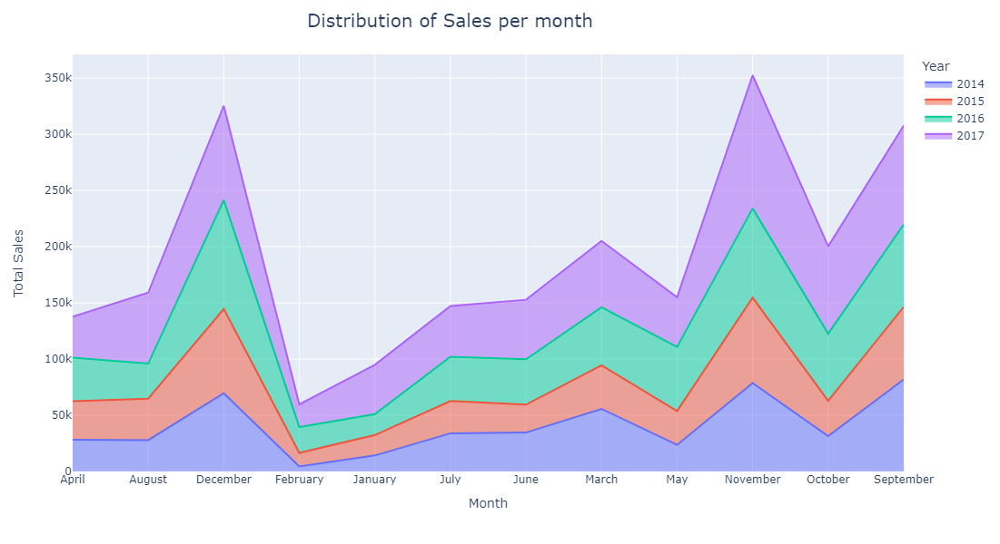

In [45]:
fig = px.area(monthly_sales, x='Month', y='Sales', color='Year',
              labels={'Year': 'Year', 'Month': 'Month', 'Sales': 'Total Sales'})

fig.update_layout(
    height=600, width=1300,
    title_text = 'Distribution of Sales per month ',
    title_x=0.45,title_font=dict(size=20)
)

fig.show()

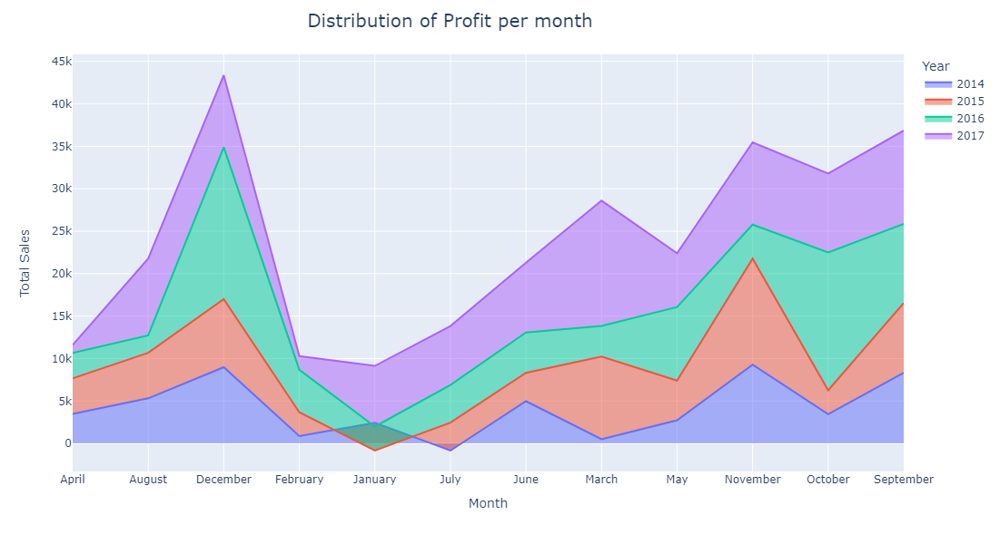

In [46]:
fig = px.area(monthly_sales, x='Month', y='Profit', color='Year',
              labels={'Year': 'Year', 'Month': 'Month', 'Profit': 'Total Sales'})

fig.update_layout(
    height=600, width=1300,
    title_text = 'Distribution of Profit per month ',
    title_x=0.45,title_font=dict(size=20)
)

fig.show()

# sales over subcategory analysis 

In [47]:
#sorting sales of sub_category
sub_category_sales = pd.DataFrame(data.groupby('Sub-Category')['Sales'].sum())
sub_sales = pd.DataFrame(sub_category_sales.sort_values('Sales', ascending=False))
sub_sales

,Sales
Sub-Category,
Phones,330007.0540
Chairs,328449.1030
Storage,223843.6080
Tables,206965.5320
Binders,203412.7330
Machines,189238.6310
Accessories,167380.3180
Copiers,149528.0300
Bookcases,114879.9963


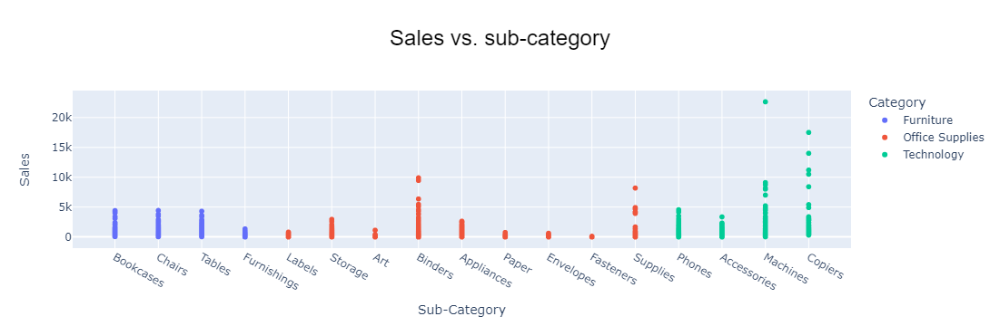

In [48]:
scatter_plot = px.scatter(
    data,
    x='Sub-Category',
    y='Sales',
    title='Sales vs. sub-category',
    color='Category',

)

# Set the title font properties
scatter_plot.update_layout(
    title_font_family="Arial",
    title_font_size=24,
    title_font_color="black",
    title_x=0.5,width=1200
)

scatter_plot.show()

C:\Users\billu\AppData\Local\Temp\ipykernel_4680\3328873597.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\billu\AppData\Local\Temp\ipykernel_4680\3328873597.py:10: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.



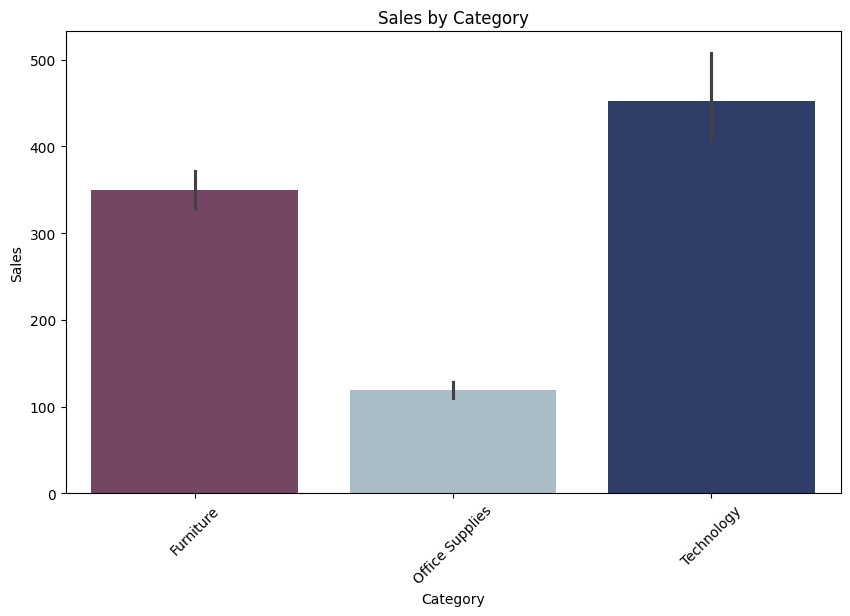

In [49]:
#the relation between sales and category
color2=['#0a2d2e',  '#1c4e4f',  '#436e6f',  '#6a8e8f',  '#879693',  '#a49e97',  '#deae9f',  '#efd7cf',  '#f7ebe7', '#ffffff']
color1=[ '#44a9b8',  '#c55087',   '#91b49f','#f3f3f3', '#cbb079',  '#cec78e',  '#273454',  '#d79493',  '#556255' , '#c1d0d1','#273454',  '#d79493',  '#556255' , '#c1d0d1']
color=['#30039c',  '#22026d',  '#d3c0ff',  '#a782ff',  '#ff9600',  '#b36900',  '#ffe5bf',  '#ffcb80', '#fffc00','#b3b000']
color3=['#730220',  '#a60326',  '#b53737',  '#c46a47',  '#95998c',  '#65c8d0',  '#2968ba',  '#1b48a0',  '#124787', '#0e2450','#730220',  '#a60326',  '#b53737',  '#c46a47',  '#95998c',  '#65c8d0',  '#2968ba',  '#1b48a0',  '#124787']
color4=['#de324c',  '#e95e56',  '#f4895f',  '#f8e16f',  '#2ac196',  '#95cf92',  '#66b5af',  '#369acc',  '#6678b7',  '#9656a2','#2ac196',  '#95cf92',  '#66b5af',  '#369acc',  '#6678b7',  '#9656a2']
color5=['#2a3e4b',  '#4cbbb3',  '#dcdfd8',  '#8f9c9d',  '#3d6f6d',  '#5a5f4e',  '#70d0cc',  '#428c7c',  '#44546c',  '#248c84']
c1=['#7C3E66','#A5BECC','#243A73','#A76F6F','#D7C0AE']
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Sales', data=data, palette=c1)
plt.title('Sales by Category')
plt.xticks(rotation=45)
plt.show()


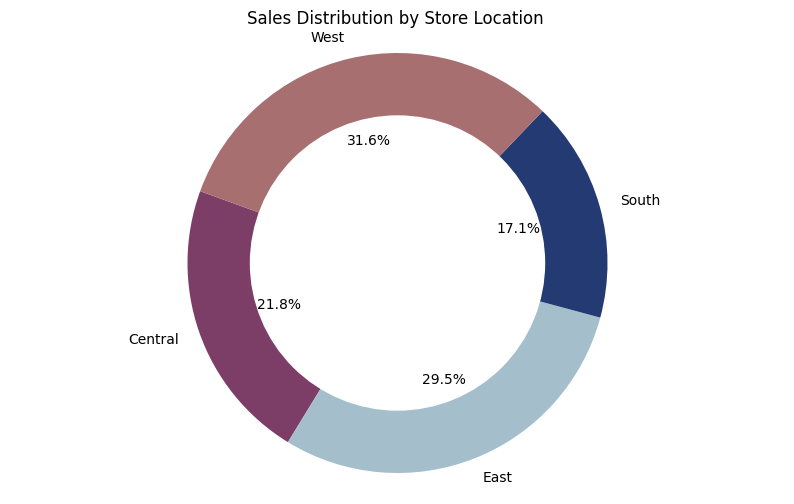

In [50]:
c1=['#7C3E66','#A5BECC','#243A73','#A76F6F','#D7C0AE']
store_sales = data.groupby(['Region'])[['Sales', 'Profit']].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.pie(store_sales['Sales'], labels=store_sales['Region'],autopct='%1.1f%%', startangle=160,colors=c1)
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Sales Distribution by Store Location ')
plt.axis('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()

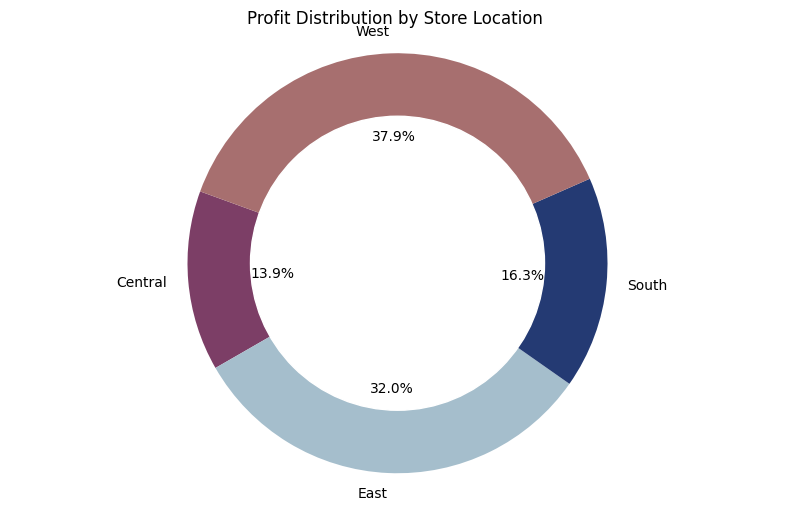

In [51]:
store_sales = data.groupby(['Region'])[['Sales', 'Profit']].sum().reset_index()
store_sales

plt.figure(figsize=(10, 6))
plt.pie(store_sales['Profit'], labels=store_sales['Region'],autopct='%1.1f%%', startangle=160,colors=c1)
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Profit Distribution by Store Location ')
plt.axis('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()


# top states with highest sales 

In [52]:
state_sales = data.groupby('State')['Sales'].sum().reset_index()

# Find the state with the highest sales
state_with_highest_sales = state_sales[state_sales['Sales'] == state_sales['Sales'].max()]

print("State with the highest sales:", state_with_highest_sales['State'].values[0])
print("Total sales in that state:", state_with_highest_sales['Sales'].values[0])
print(f"with total of {round(state_with_highest_sales['Sales'].values[0] / (data['Sales'].sum()) * 100, 2)}% of sales")

State with the highest sales: California
Total sales in that state: 457687.6315
with total of 19.92% of sales


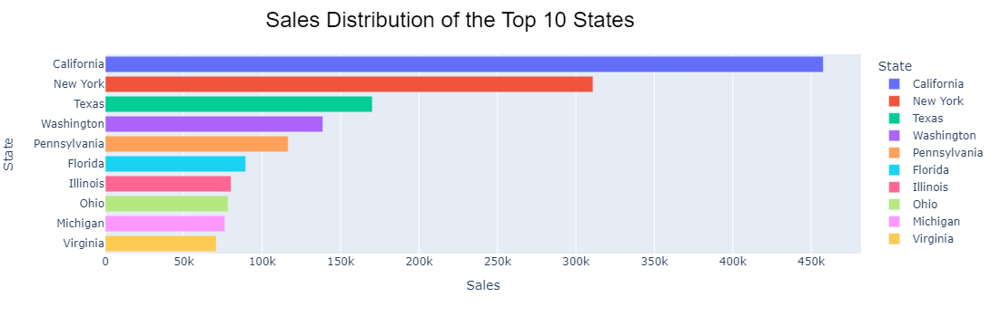

In [53]:
state_sales_sorted = state_sales.sort_values(by='Sales', ascending=False)
top_10_states = state_sales_sorted.head(10)
fig = px.bar(top_10_states, x='Sales', y='State', orientation='h',color='State')
fig.update_layout(title="Sales Distribution of the Top 10 States",title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
fig.show()


# impact of delivery days on  sales 

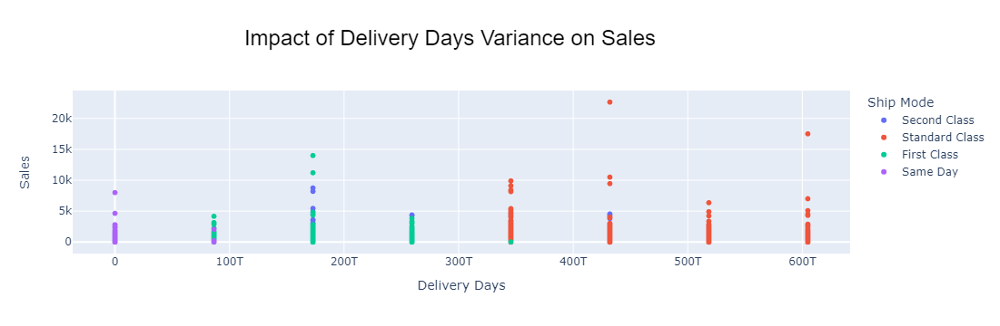

In [54]:
scatter_fig = px.scatter(data, x='Delivery Days', y='Sales', color='Ship Mode',
                         title='Impact of Delivery Days Variance on Sales',
                         labels={'Delivery Days Variance': 'Delivery Days Variance', 'Sales': 'Sales'})
scatter_fig .update_layout(title="Impact of Delivery Days Variance on Sales",title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
scatter_fig.show()


#  Sales Distribution over the week

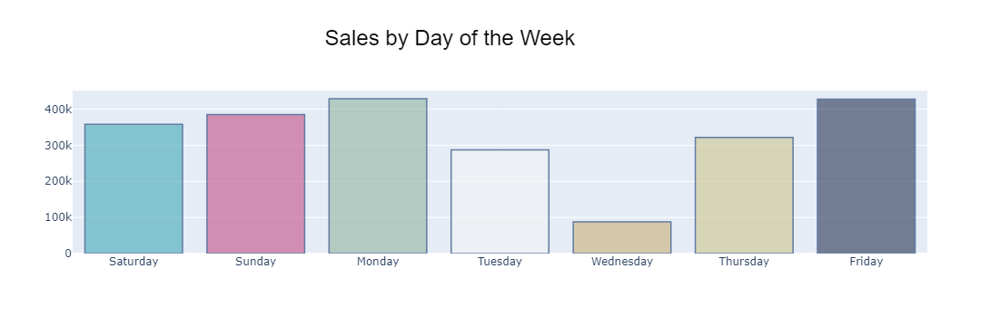

In [55]:
data['Day of Week'] = data['Order Date'].dt.day_name()
daily_sales = data.groupby('Day of Week')['Sales'].sum().reset_index()
days_of_week = ['Saturday', 'Sunday','Monday', 'Tuesday', 'Wednesday','Thursday', 'Friday']
daily_sales['Day of Week'] = pd.Categorical(daily_sales['Day of Week'], categories=days_of_week, ordered=True)
daily_sales = daily_sales.sort_values(by='Day of Week')

fig = go.Figure(data=[go.Bar(
    x=daily_sales['Day of Week'],
    y=daily_sales['Sales'],
)])
fig.update_traces(marker_color=color1, marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_layout(title='Sales by Day of the Week',title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
fig.show()

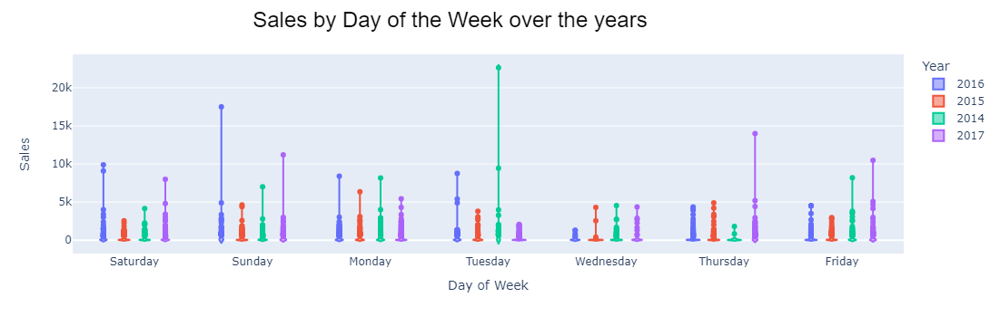

In [56]:
fig = px.violin(data, x='Day of Week', y='Sales', color='Year',
                category_orders={'Day of Week': days_of_week})
fig.update_layout(title='Sales by Day of the Week over the years',title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
fig.show()

<Figure size 2000x600 with 0 Axes>

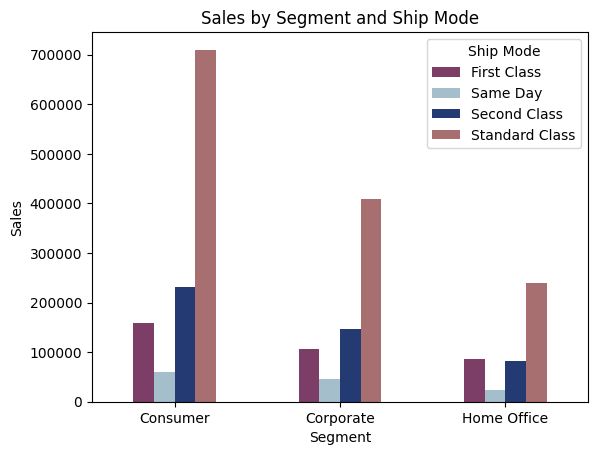

In [57]:
pivot_table = data.pivot_table(index = "Segment", columns = "Ship Mode", values = 'Sales', aggfunc = 'sum')
plt.figure(figsize=(20, 6))

pivot_table.plot(kind='bar', stacked=False,color=c1)
plt.title('Sales by Segment and Ship Mode')

plt.ylabel('Sales')
plt.xticks(rotation=0)
plt.show()

# How are sales distributed among different cities?

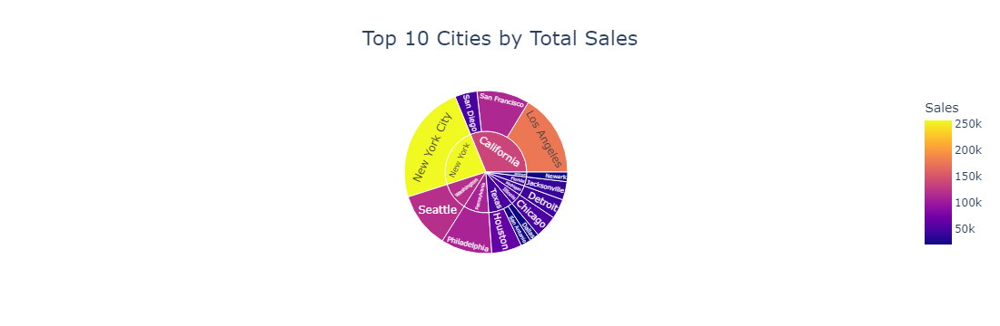

In [58]:

city_sales = data.groupby(['State', 'City'])['Sales'].sum().reset_index()
top_10_cities = city_sales.nlargest(13, 'Sales')
fig = px.sunburst(
    top_10_cities,
    values='Sales',
    path=['State', 'City'],
    hover_name='City',
    color='Sales',
    title='Top 10 Cities by Total Sales',
)
fig.update_layout(title_text="Top 10 Cities by Total Sales",title_font_size = 22, title_x=0.5,width=1000)

fig.show()

# how no of sales,discount impact on profits 
# top 10 profit and loss country sales,cites and regions 

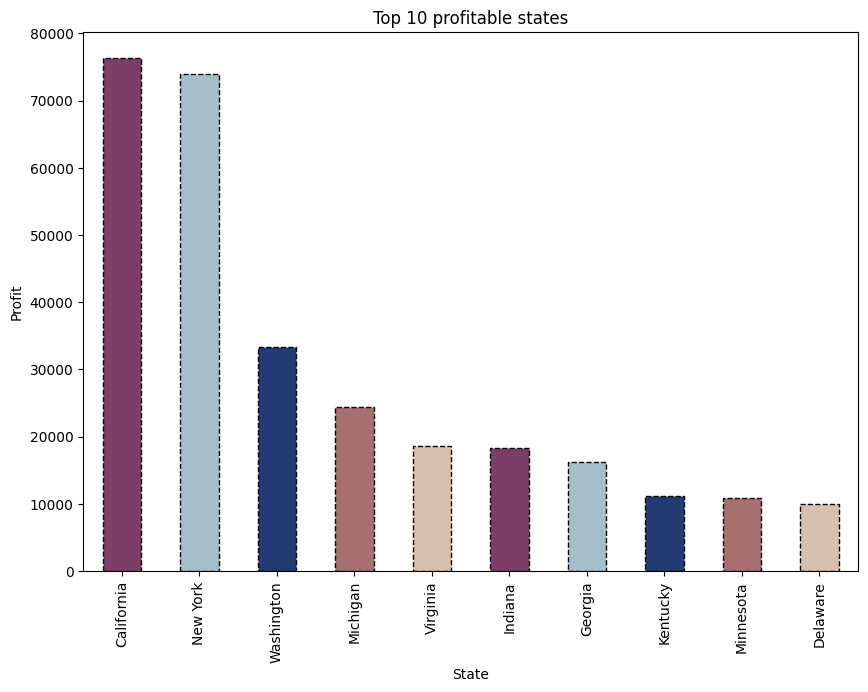

In [59]:
plt.figure(figsize=(10,7))
plt.title('Top 10 profitable states')
plt.xlabel('State')
plt.ylabel('Profit')
data.groupby('State')['Profit'].sum().sort_values(ascending=False)[0:10].plot(kind='bar',color=c1,ls='dashed',edgecolor='Black')
plt.show()

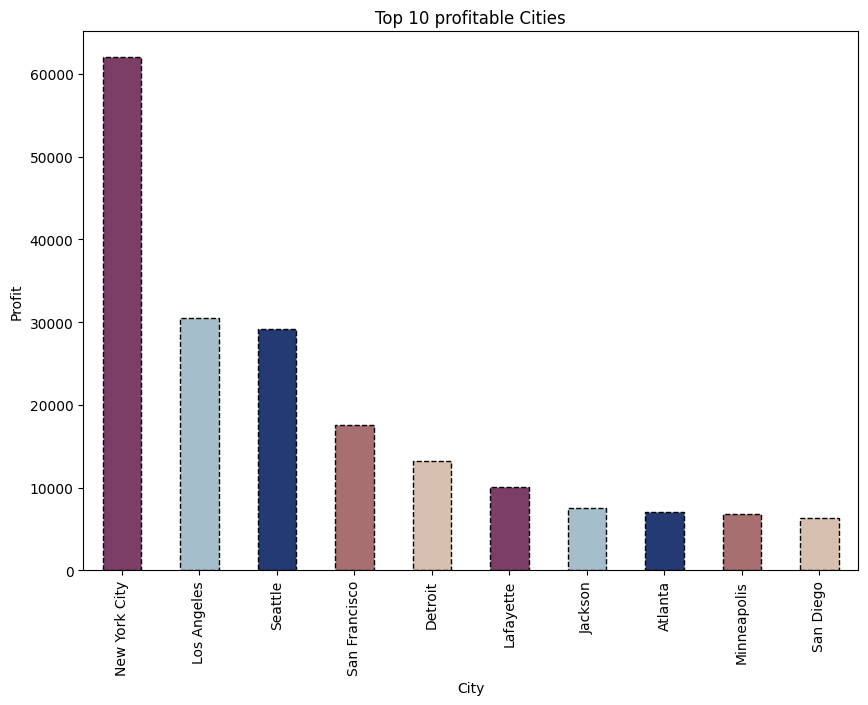

In [60]:
plt.figure(figsize=(10,7))
plt.title('Top 10 profitable Cities')
plt.xlabel('City')
plt.ylabel('Profit')
data.groupby('City')['Profit'].sum().sort_values(ascending=False)[0:10].plot(kind='bar',color=c1,ls='dashed',edgecolor='Black')
plt.show()

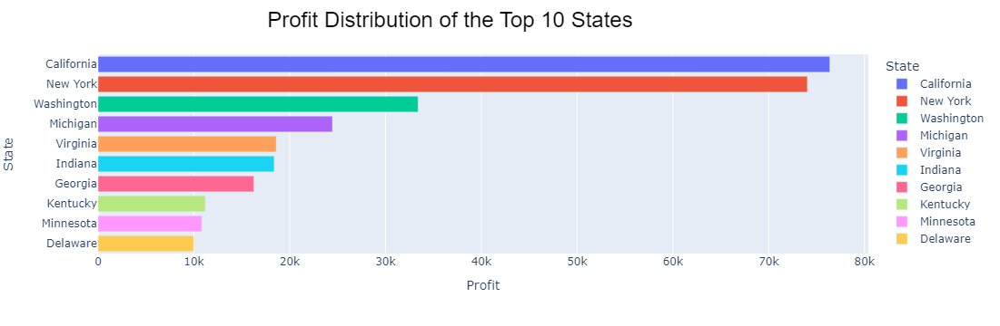

In [61]:
state_sales = data.groupby('State')['Profit'].sum().reset_index()

# Find the state with the highest sales
state_with_highest_sales = state_sales[state_sales['Profit'] == state_sales['Profit'].max()]
state_sales_sorted = state_sales.sort_values(by='Profit', ascending=False)
top_10_states = state_sales_sorted.head(10)
fig = px.bar(top_10_states, x='Profit', y='State', orientation='h',color='State')
fig.update_layout(title="Profit Distribution of the Top 10 States",title_x=0.45,width=1300,title_font=dict(size=24, family="Arial", color="black"))
fig.show()

In [62]:
#LEAST SELLING CITIES
least_cities = data[['City' ,'Sales']].sort_values(by = ["Sales"], ascending = True).head(10)
least_cities

,City,Sales
4101,Houston,0.444
9292,Waco,0.556
8658,Chicago,0.836
4711,Philadelphia,0.852
2106,Mesquite,0.876
7548,Huntsville,0.898
8033,Houston,0.984
2761,San Francisco,0.990
8024,Dallas,1.044
1332,Dallas,1.080


In [63]:
#HIGHEST SELLING CITIES
top_cities = data[['City' ,'Sales']].sort_values(by = ["Sales"] ,ascending = False).head(10)
top_cities

,City,Sales
2697,Jacksonville,22638.480
6826,Lafayette,17499.950
8153,Seattle,13999.960
2623,New York City,11199.968
4190,Newark,10499.970
9039,Detroit,9892.740
4098,Minneapolis,9449.950
4277,Lakewood,9099.930
8488,Arlington,8749.950
6425,Philadelphia,8399.976


In [64]:
#HIGHEST PROFITABLE CITIES
profit_cities = data[['City', 'Profit']].sort_values(by = ["Profit"], ascending = False).head(10)
profit_cities

,City,Profit
6826,Lafayette,8399.9760
8153,Seattle,6719.9808
4190,Newark,5039.9856
9039,Detroit,4946.3700
4098,Minneapolis,4630.4755
2623,New York City,3919.9888
509,Atlanta,3177.4750
8488,Arlington,2799.9840
7666,Providence,2591.9568
6520,Jackson,2504.2216


In [65]:
#NON-PROFITABLE CITIES
nonprofit_cities = pd.DataFrame(data.groupby('City')['Profit'].sum()).sort_values(by='Profit', ascending=True).head(20)
nonprofit_cities

,Profit
City,
Philadelphia,-13837.7674
Houston,-10153.5485
San Antonio,-7299.0502
Lancaster,-7239.0684
Chicago,-6654.5688
Burlington,-3622.8772
Dallas,-2846.5257
Phoenix,-2790.8832
Aurora,-2691.7386


# data preprocessing 

In [66]:
data = pd.read_excel("Storedata.xlsx")
data.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [67]:
data.drop(['Row ID', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID', 'Customer Name', 'Country', 'Postal Code', 
           'Region', 'Product ID', 'Product Name'], axis=1, inplace=True)
data.columns

Index(['Order Date', 'Segment', 'City', 'State', 'Category', 'Sub-Category',
       'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [68]:
#encoding of categorial features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in data.columns:
    if(data.dtypes[i] == 'object'):
        data[i] = le.fit_transform(data[i])

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Order Date    9994 non-null   int32  
 1   Segment       9994 non-null   int32  
 2   City          9994 non-null   int32  
 3   State         9994 non-null   int32  
 4   Category      9994 non-null   int32  
 5   Sub-Category  9994 non-null   int32  
 6   Sales         9994 non-null   float64
 7   Quantity      9994 non-null   int64  
 8   Discount      9994 non-null   float64
 9   Profit        9994 non-null   float64
dtypes: float64(3), int32(6), int64(1)
memory usage: 546.7 KB


# using the some of machine learning modelling for the predication 

In [69]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score #cross validation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, r2_score, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
from mlxtend.plotting import plot_confusion_matrix

#using standard scaler 
sc = StandardScaler()
x = data.drop(['Sales'] , axis = 1).values
y =data['Sales'].values

#train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.33, random_state=42)
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

##  linear regression 


Linear Regression
R2 Score (Training): 0.36819689508379183
R2 Score (Testing): 0.17208057949166022
R2 Score: 0.17208057949166022
Mean Squared Error: 470101.13612826855
Mean Absolute Error: 237.30978217988547
Root Mean Squared Error: 685.6392171749429
Precision: 1.0
Recall: 0.9657471961200363
F1 Score: 0.9825751734772552
Accuracy: 0.9657471961200363
Time Taken: 0.00445866584777832 seconds


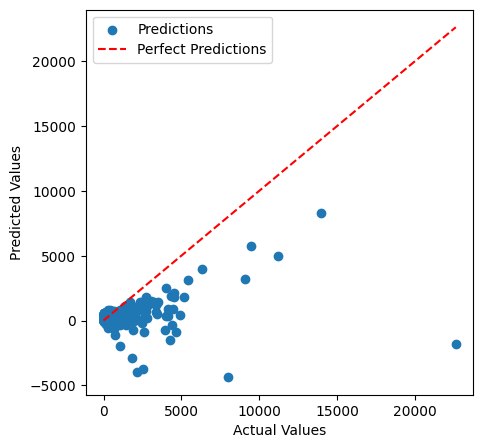

In [77]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import cross_val_predict
import numpy as np
import matplotlib.pyplot as plt
import time

# Assuming x_train, y_train, x_test, y_test are defined

lr = LinearRegression()
start_time = time.time()  # Record start time
lr.fit(x_train, y_train)
end_time = time.time()  # Record end time

print("Linear Regression")
print('R2 Score (Training):', lr.score(x_train, y_train))
print('R2 Score (Testing):', lr.score(x_test, y_test))

y_pred = lr.predict(x_test)

mse = mean_squared_error(y_test, y_pred)  # Mean squared error
rmse = np.sqrt(mse)  # Root mean squared error
reg_score = r2_score(y_test, y_pred)  # R2 score
mae = mean_absolute_error(y_test, y_pred)  # Mean absolute error

print('R2 Score:', reg_score)
print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)

# Classification Metrics (using cross_val_predict for stability)
y_pred_binary = np.round(y_pred)  # Convert to binary for classification
precision = precision_score(y_test > 0, y_pred_binary > 0)
recall = recall_score(y_test > 0, y_pred_binary > 0)
f1 = f1_score(y_test > 0, y_pred_binary > 0)
accuracy = accuracy_score(y_test > 0, y_pred_binary > 0)

print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)
print('Accuracy:', accuracy)

# Time taken
time_taken = end_time - start_time
print('Time Taken:', time_taken, 'seconds')

# Visualization
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
ax.scatter(y_test, y_pred, label='Predictions')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red', label='Perfect Predictions')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


## ridge regression 

Ridge Regression
R2 Score (Training): 0.36819688539862694
R2 Score (Testing): 0.17208343717291263
R2 Score: 0.17208343717291263
Mean Squared Error: 470099.5135075519
Mean Absolute Error: 237.3112868415117
Root Mean Squared Error: 685.638033883442
Precision: 1.0
Recall: 0.9657471961200363
F1 Score: 0.9825751734772552
Accuracy: 0.9657471961200363
Time Taken: 0.02299785614013672 seconds


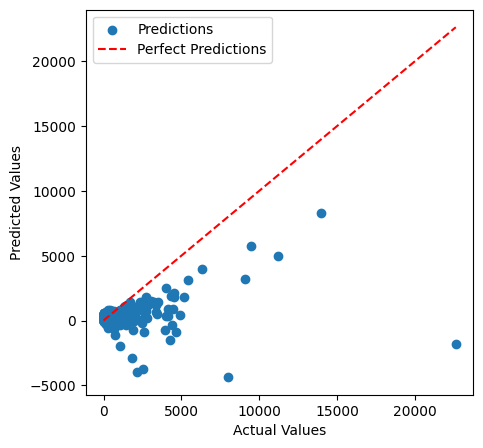

In [78]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import cross_val_predict
import numpy as np
import matplotlib.pyplot as plt
import time

# Assuming x_train, y_train, x_test, y_test are defined

ridge = Ridge(alpha=1.0)  # You can adjust the alpha parameter as needed
start_time = time.time()  # Record start time
ridge.fit(x_train, y_train)
end_time = time.time()  # Record end time

print("Ridge Regression")
print('R2 Score (Training):', ridge.score(x_train, y_train))
print('R2 Score (Testing):', ridge.score(x_test, y_test))

y_pred = ridge.predict(x_test)

mse = mean_squared_error(y_test, y_pred)  # Mean squared error
rmse = np.sqrt(mse)  # Root mean squared error
reg_score = r2_score(y_test, y_pred)  # R2 score
mae = mean_absolute_error(y_test, y_pred)  # Mean absolute error

print('R2 Score:', reg_score)
print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)

# Classification Metrics (using cross_val_predict for stability)
y_pred_binary = np.round(y_pred)  # Convert to binary for classification
precision = precision_score(y_test > 0, y_pred_binary > 0)
recall = recall_score(y_test > 0, y_pred_binary > 0)
f1 = f1_score(y_test > 0, y_pred_binary > 0)
accuracy = accuracy_score(y_test > 0, y_pred_binary > 0)

print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)
print('Accuracy:', accuracy)

# Time taken
time_taken = end_time - start_time
print('Time Taken:', time_taken, 'seconds')

# Visualization
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
ax.scatter(y_test, y_pred, label='Predictions')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red', label='Perfect Predictions')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


## Lasso Regression

Lasso Regression
R2 Score (Training): 0.3681633297207245
R2 Score (Testing): 0.17215722869572914
R2 Score: 0.17215722869572914
Mean Squared Error: 470057.6139242671
Mean Absolute Error: 237.09955184892877
Root Mean Squared Error: 685.60747802534
Precision: 1.0
Recall: 0.9672628069111852
F1 Score: 0.9833590138674884
Accuracy: 0.9672628069111852
Time Taken: 0.024647951126098633 seconds


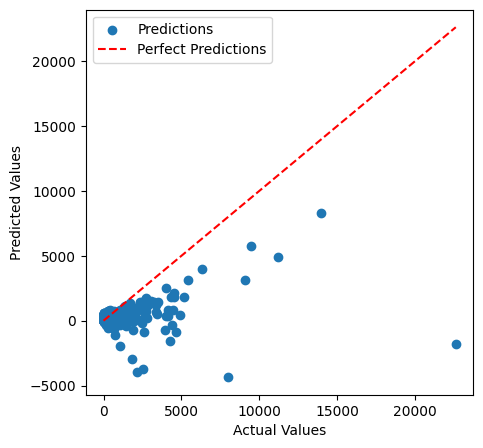

In [79]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import cross_val_predict
import numpy as np
import matplotlib.pyplot as plt
import time

# Assuming x_train, y_train, x_test, y_test are defined

lasso = Lasso(alpha=1.0)  # You can adjust the alpha parameter as needed
start_time = time.time()  # Record start time
lasso.fit(x_train, y_train)
end_time = time.time()  # Record end time

print("Lasso Regression")
print('R2 Score (Training):', lasso.score(x_train, y_train))
print('R2 Score (Testing):', lasso.score(x_test, y_test))

y_pred = lasso.predict(x_test)

mse = mean_squared_error(y_test, y_pred)  # Mean squared error
rmse = np.sqrt(mse)  # Root mean squared error
reg_score = r2_score(y_test, y_pred)  # R2 score
mae = mean_absolute_error(y_test, y_pred)  # Mean absolute error

print('R2 Score:', reg_score)
print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)

# Classification Metrics (using cross_val_predict for stability)
y_pred_binary = np.round(y_pred)  # Convert to binary for classification
precision = precision_score(y_test > 0, y_pred_binary > 0)
recall = recall_score(y_test > 0, y_pred_binary > 0)
f1 = f1_score(y_test > 0, y_pred_binary > 0)
accuracy = accuracy_score(y_test > 0, y_pred_binary > 0)

print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)
print('Accuracy:', accuracy)

# Time taken
time_taken = end_time - start_time
print('Time Taken:', time_taken, 'seconds')

# Visualization
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
ax.scatter(y_test, y_pred, label='Predictions')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red', label='Perfect Predictions')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


## DecisionTreeRegressor

Decision Tree Regression
R2 Score (Training): 0.8053791068936225
R2 Score (Testing): 0.6136366405671223
R2 Score: 0.6136366405671223
Mean Squared Error: 219381.0771055597
Mean Absolute Error: 132.99631073248335
Root Mean Squared Error: 468.38133727291023
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Accuracy: 1.0
Time Taken: 0.04102206230163574 seconds


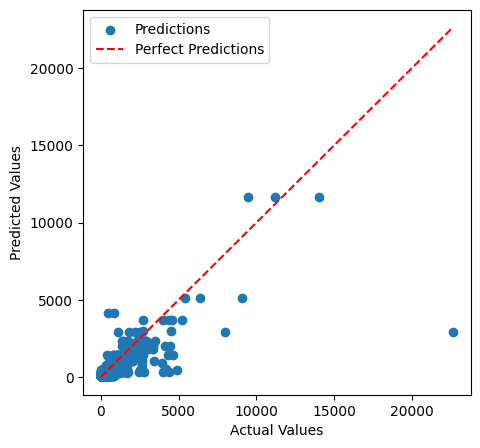

In [80]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import cross_val_predict
import numpy as np
import matplotlib.pyplot as plt
import time

# Assuming x_train, y_train, x_test, y_test are defined

dt = DecisionTreeRegressor(max_depth=6, max_features=7, min_samples_split=10, random_state=2)
start_time = time.time()  # Record start time
dt.fit(x_train, y_train)
end_time = time.time()  # Record end time

print("Decision Tree Regression")
print('R2 Score (Training):', dt.score(x_train, y_train))
print('R2 Score (Testing):', dt.score(x_test, y_test))

y_pred = dt.predict(x_test)

mse = mean_squared_error(y_test, y_pred)  # Mean squared error
rmse = np.sqrt(mse)  # Root mean squared error
reg_score = r2_score(y_test, y_pred)  # R2 score
mae = mean_absolute_error(y_test, y_pred)  # Mean absolute error

print('R2 Score:', reg_score)
print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)

# Classification Metrics (using cross_val_predict for stability)
y_pred_binary = np.round(y_pred)  # Convert to binary for classification
precision = precision_score(y_test > 0, y_pred_binary > 0)
recall = recall_score(y_test > 0, y_pred_binary > 0)
f1 = f1_score(y_test > 0, y_pred_binary > 0)
accuracy = accuracy_score(y_test > 0, y_pred_binary > 0)

print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)
print('Accuracy:', accuracy)

# Time taken
time_taken = end_time - start_time
print('Time Taken:', time_taken, 'seconds')

# Visualization
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
ax.scatter(y_test, y_pred, label='Predictions')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red', label='Perfect Predictions')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()
